## Problem Statement:

From an image dataset we need to find N similar images on a given query images.

## Importing Data:

**Loading Data using Curl-WGet:**

In [ ]:
!wget --header="Host: doc-10-1c-docs.googleusercontent.com" --header="User-Agent: Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/84.0.4147.125 Safari/537.36" --header="Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.9" --header="Accept-Language: en-IN,en;q=0.9,en-GB;q=0.8,en-US;q=0.7,te;q=0.6,ru;q=0.5" --header="Referer: https://drive.google.com/" --header="Cookie: AUTH_4mcuou20mns0bnj0sduihld1f8t3235v_nonce=b9s3il0qbt66q; NID=204=Ays1_cpotq_cm0Nb8bI5w_F9WYRV9rPSgAxwJ4IQJPvPE5l1De1p5T0i_G8ks9GWBNkMcfcVizzpkqjbVmNmOMKYRPQ5VhQYLtQKRevszoS_v_6s2kqMVcPHQanN09BGmeFe45gU5QyrDCYmmtNMqeTsdqgq1PddAdhKBXWEJ-o; _ga=GA1.2.1000151777.1596382410" --header="Connection: keep-alive" "https://doc-10-1c-docs.googleusercontent.com/docs/securesc/snqegoftrruv9dh3ufo1tfoti4b5rfsr/lc95gejn67goa7fnhfbpt4tbq0jk9vn7/1597764600000/07496480791912752493/08286913039080874450/1VT-8w1rTT2GCE5IE5zFJPMzv7bqca-Ri?e=download&authuser=0&nonce=b9s3il0qbt66q&user=08286913039080874450&hash=lg9tmmkjjqqfmbdgtdr08daaltq6qpv4" -c -O 'dataset.zip'

--2020-08-18 15:31:45--  https://doc-10-1c-docs.googleusercontent.com/docs/securesc/snqegoftrruv9dh3ufo1tfoti4b5rfsr/lc95gejn67goa7fnhfbpt4tbq0jk9vn7/1597764600000/07496480791912752493/08286913039080874450/1VT-8w1rTT2GCE5IE5zFJPMzv7bqca-Ri?e=download&authuser=0&nonce=b9s3il0qbt66q&user=08286913039080874450&hash=lg9tmmkjjqqfmbdgtdr08daaltq6qpv4
Resolving doc-10-1c-docs.googleusercontent.com (doc-10-1c-docs.googleusercontent.com)... 172.253.120.132, 2a00:1450:400c:c01::84
Connecting to doc-10-1c-docs.googleusercontent.com (doc-10-1c-docs.googleusercontent.com)|172.253.120.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/zip]
Saving to: ‘dataset.zip’

dataset.zip             [         <=>        ] 231.86M   102MB/s    in 2.3s    

2020-08-18 15:31:48 (102 MB/s) - ‘dataset.zip’ saved [243126662]



In [ ]:
!unzip dataset.zip

*    Using CurlWget method takes couple of seconds to load the data.

**Note1:** When the PC gets turned off all the data you loaded through it will get lost. So you need to load the data again when you run the below code snippets.

**Note2:** CurlWget gives a .zip file. So we need to unzip the folders before using it.

**Mounting Google Drive:**

To access/create files in google drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

**Loading Dependencies:**

In [ ]:
# For commands
import os
os.chdir('/content/')
import time
from tqdm.notebook import tqdm
import warnings
warnings.filterwarnings('ignore')
# For array manipulation
import numpy as np
import pandas as pd
import pandas.util.testing as tm
# For visualization
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns
import cv2
from pylab import *
from sklearn.manifold import TSNE
#For model performance
from sklearn.metrics import pairwise_distances
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.externals import joblib
#For model training
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
import tensorflow as tf
from sklearn.neighbors import KNeighborsClassifier
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, Activation, MaxPooling2D, UpSampling2D
from tensorflow.keras.optimizers import Adam, Adagrad, RMSprop
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import backend as K
from keras.models import load_model
from keras.preprocessing import image

*    I am using tensorflow.keras (2.0 version) throughout this assignment.
*    I am doing this case study in google colab. So all the paths will be specified according to colab directories.

In [ ]:
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input

In [ ]:
file_path = os.listdir('dataset')
print(len(file_path))

4738


*    Their are of total 4738 images.
*    Since the dataset is small we need to take of model training so that it won't get overfit or underfit.
*    Interestingly all the images are in same resolution. (512x512)

**Splitting the data into Train & Test sets:**

In [1]:
train_files, test_files = train_test_split(file_path, test_size = 0.15)
print("Number of Training Images:",len(train_files))
print("Number of Test Images: ",len(test_files))

train_files = pd.DataFrame(train_files,columns=['filepath'])
test_files = pd.DataFrame(test_files,columns=['filepath'])
#converting into .csv file for future reference.
train_files.to_csv('/content/drive/My Drive/train_file.csv')
test_files.to_csv('/content/drive/My Drive/test_file.csv')

Number of Training Images: 4027
Number of Test Images: 711


In [ ]:
#loading csv files. 
train_files = list(pd.read_csv('/content/drive/My Drive/train_file.csv')['filepath'])
test_files = list(pd.read_csv('/content/drive/My Drive/test_file.csv')['filepath'])

*    Taking the file path of all the images and splitting that list into train and test. So that their will be no need of splitting the data again in future and we can access those sets directly by storing it in drive.
*    Storing the end result into .csv format so that their will be no data leakage problems in future.

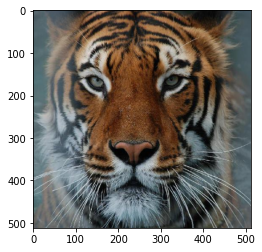

In [ ]:
img = cv2.imread('/content/dataset/'+train_files[0])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

**Reading images:**

In [ ]:
def image2array(file_array):

    """
    Reading and Converting images into numpy array by taking path of images.
    Arguments:
    file_array - (list) - list of file(path) names
    Returns:
    A numpy array of images. (np.ndarray)
    """

    image_array = []
    for path in tqdm(file_array):
        img = cv2.imread('/content/dataset/'+path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (224,224))
        image_array.append(np.array(img))
    image_array = np.array(image_array)
    image_array = image_array.reshape(image_array.shape[0], 224, 224, 3) 
    image_array = image_array.astype('float32')
    image_array /= 255 
    return np.array(image_array)

In [ ]:
train_data = image2array(train_files)
print("Length of training dataset:",train_data.shape)
test_data = image2array(test_files)
print("Length of test dataset:",test_data.shape)


(4027, 224, 224, 3)



(711, 224, 224, 3)


# **Model Architecture & Model Training:**

In [ ]:
def encoder_decoder_model():

    """
    Used to build Convolutional Autoencoder model architecture to get compressed image data which is easier to process.
    Returns:
    Auto encoder model
    """
    #Encoder 
    model = Sequential(name='Convolutional AutoEncoder Model')
    model.add(Conv2D(32, kernel_size=(3, 3),activation='relu',input_shape=(224, 224, 3),padding='same', name='Encoding_Conv2D_1'))
    model.add(MaxPooling2D(pool_size=(2, 2), padding='same', name='Encoding_MaxPooling2D_1'))
    model.add(Conv2D(16, kernel_size=(3, 3), activation='relu', padding='same', name='Encoding_Conv2D_2'))
    model.add(MaxPooling2D(pool_size=(2, 2), padding='same', name='Encoding_MaxPooling2D_2'))
    model.add(Conv2D(8, kernel_size=(3, 3), activation='relu', padding='same', name='Encoding_Conv2D_3'))
    model.add(MaxPooling2D(pool_size=(2, 2), padding='same', name='Encoding_MaxPooling2D_3'))
    
    #Decoder
    model.add(Conv2D(8, kernel_size=(3, 3), activation='relu', padding='same', name='Decoding_Conv2D_1'))
    model.add(UpSampling2D((2, 2), name='Decoding_Upsamping2D_1'))
    model.add(Conv2D(16, kernel_size=(3, 3), activation='relu', padding='same',name='Decoding_Conv2D_2'))
    model.add(UpSampling2D((2, 2),name='Decoding_Upsamping2D_2'))
    model.add(Conv2D(32, kernel_size=(3, 3), activation='relu', padding='same',name='Decoding_Conv2D_3'))
    model.add(UpSampling2D((2, 2),name='Decoding_Upsamping2D_3'))
    model.add(Conv2D(3, kernel_size=(3, 3), padding='same',activation='sigmoid',name='Decoding_Output'))
    return model

Model: "Convolutional AutoEncoder Model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
Encoding_Conv2D_1 (Conv2D)   (None, 224, 224, 32)      896       
_________________________________________________________________
Encoding_MaxPooling2D_1 (Max (None, 112, 112, 32)      0         
_________________________________________________________________
Encoding_Conv2D_2 (Conv2D)   (None, 112, 112, 16)      4624      
_________________________________________________________________
Encoding_MaxPooling2D_2 (Max (None, 56, 56, 16)        0         
_________________________________________________________________
Encoding_Conv2D_3 (Conv2D)   (None, 56, 56, 8)         1160      
_________________________________________________________________
Encoding_MaxPooling2D_3 (Max (None, 28, 28, 8)         0         
_________________________________________________________________
Decoding_Conv2D_1 (Conv2D)   (None,

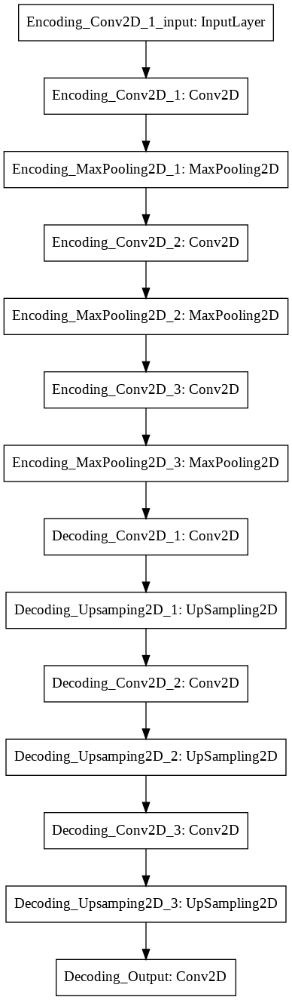

In [ ]:
model = encoder_decoder_model()
model.summary()
print("\n")
tf.keras.utils.plot_model(model, to_file='/content/drive/My Drive/model.png')

**Hyper Parameter Tuning:**

In [ ]:
parameters = {'Adagrad':[0.01,0.001,0.0001,0.00001],'Adam':[0.01,0.001,0.0001,0.00001],'Rmsprop':[0.01,0.001,0.0001,0.00001]}
result = []
for i in parameters.keys():
    print("{} as an optimizer:".format(i))
    values = parameters[i]
    result_ = []
    for learning_rate in values:
        print("\t\tUsing learning_rate: "+str(learning_rate))
        model = encoder_decoder_model()
        if i=='Adam':
            optimizer = Adam(learning_rate=learning_rate)
        elif i=='Adagrad':
            optimizer = Adagrad(learning_rate=learning_rate)
        else:
            optimizer = RMSprop(learning_rate=learning_rate)
        model.compile(optimizer=optimizer, loss='mse')             # compiling 
        model.fit(train_data, train_data, epochs=5, batch_size=32,validation_data=(test_data,test_data))  # fitting data
        result_.append(model.history.history)           # taking result to judge the best parameters.
    print()
    result.append(result_)

Adagrad as an optimizer:
		Using learning_rate: 0.01
Epoch 1/5
126/126 [==============================] - 11s 87ms/step - loss: 0.0553 - val_loss: 0.0536
Epoch 2/5
126/126 [==============================] - 11s 85ms/step - loss: 0.0535 - val_loss: 0.0521
Epoch 3/5
126/126 [==============================] - 11s 84ms/step - loss: 0.0522 - val_loss: 0.0509
Epoch 4/5
126/126 [==============================] - 11s 84ms/step - loss: 0.0510 - val_loss: 0.0497
Epoch 5/5
126/126 [==============================] - 11s 84ms/step - loss: 0.0496 - val_loss: 0.0480
		Using learning_rate: 0.001
Epoch 1/5
126/126 [==============================] - 11s 85ms/step - loss: 0.0554 - val_loss: 0.0547
Epoch 2/5
126/126 [==============================] - 11s 83ms/step - loss: 0.0551 - val_loss: 0.0543
Epoch 3/5
126/126 [==============================] - 11s 84ms/step - loss: 0.0548 - val_loss: 0.0540
Epoch 4/5
126/126 [==============================] - 11s 83ms/step - loss: 0.0545 - val_loss: 0.0537
Epoch 5/5

In [ ]:
def plot_(x,y1,y2,row,col,ind,title,xlabel,ylabel,label,isimage=False,color='b'):

    """
    This function is used for plotting images and graphs (Visualization of end results of model training)
    Arguments:
    x - (np.ndarray or list) - an image array
    y1 - (list) - for plotting graph on left side.
    y2 - (list) - for plotting graph on right side.
    row - (int) - row number of subplot
    col - (int) - column number of subplot
    ind - (int) - index number of subplot
    title - (string) - title of the plot 
    xlabel - (list) - labels of x axis
    ylabel - (list) - labels of y axis
    label - (string) - for adding legend in the plot
    isimage - (boolean) - True in case of image else False
    color - (char) - color of the plot (prefered green for training and red for testing).
    """
    
    plt.subplot(row,col,ind)
    if isimage:
        plt.imshow(x)
        plt.title(title)
        plt.axis('off')
    else:
        plt.plot(y1,label=label,color='g'); plt.scatter(x,y1,color='g')
        if y2!='': plt.plot(y2,color=color,label='validation'); plt.scatter(x,y2,color=color)
        plt.grid()
        plt.legend()
        plt.title(title); plt.xlabel(xlabel); plt.ylabel(ylabel)

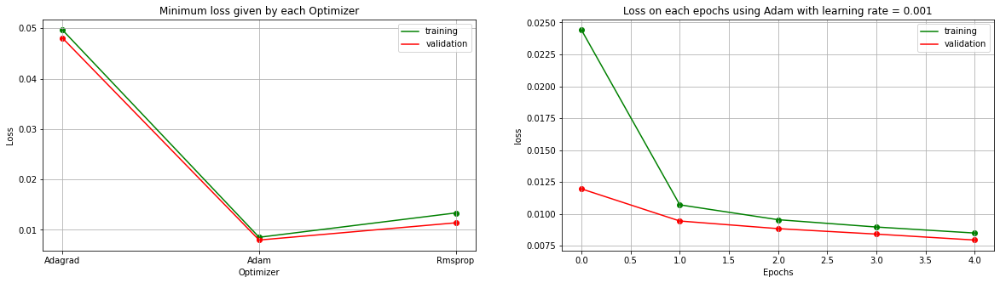

In [ ]:
min_train = []; min_val = []  
rates = list(parameters.keys())
epochs = [0,1,2,3,4]
for i in result:
    train = []; val = []
    for j in i:
        train.append(min(j['loss'])); val.append(min(j['val_loss']))  # taking minimum loss of each optimizer over all learning rates.
    min_train.append(min(train)); min_val.append(min(val))
plt.figure(figsize=(20,5))
plot_(rates,min_train,min_val,1,2,1,'Minimum loss given by each Optimizer','Optimizer','Loss','training',False,'r')
# plotting the result of adam with learning rate = 0.001 .
plot_(epochs, result[1][1]['loss'],result[1][1]['val_loss'],1,2,2,'Loss on each epochs using Adam with learning rate = 0.001','Epochs','loss','training',False,'r')
plt.show()

*    After training the model with different optimizers(Adagrad, Adam, Rmsprop), adam giving the least local minimum loss on training with learning rate = 0.001.
*    Both training loss and validation loss are almost equal and we can see our model training is not prone to overfitting and underfitting.
*    Achieved <strong>0.0085</strong> on five epochs using Adam(0.001)(optimal value).

**Training the model with Best Optimizer with Best Learning Rate:**

In [ ]:
optimizer = Adam(learning_rate=0.001)
model = encoder_decoder_model()
model.compile(optimizer=optimizer, loss='mse')
early_stopping = EarlyStopping(monitor='val_loss', mode='min',verbose=1,patience=6,min_delta=0.0001)
checkpoint = ModelCheckpoint('/content/drive/My Drive/model1.h5', monitor='val_loss', mode='min', save_best_only=True)
model.fit(train_data, train_data, epochs=30, batch_size=32,validation_data=(test_data,test_data),callbacks=[early_stopping,checkpoint])

Epoch 1/30
126/126 [==============================] - 21s 163ms/step - loss: 0.0234 - val_loss: 0.0141
Epoch 2/30
126/126 [==============================] - 19s 152ms/step - loss: 0.0115 - val_loss: 0.0103
Epoch 3/30
126/126 [==============================] - 19s 152ms/step - loss: 0.0097 - val_loss: 0.0094
Epoch 4/30
126/126 [==============================] - 19s 152ms/step - loss: 0.0091 - val_loss: 0.0091
Epoch 5/30
126/126 [==============================] - 19s 152ms/step - loss: 0.0088 - val_loss: 0.0089
Epoch 6/30
126/126 [==============================] - 19s 152ms/step - loss: 0.0086 - val_loss: 0.0086
Epoch 7/30
126/126 [==============================] - 18s 146ms/step - loss: 0.0084 - val_loss: 0.0086
Epoch 8/30
126/126 [==============================] - 19s 152ms/step - loss: 0.0082 - val_loss: 0.0084
Epoch 9/30
126/126 [==============================] - 19s 154ms/step - loss: 0.0081 - val_loss: 0.0081
Epoch 10/30
126/126 [==============================] - 19s 151ms/step - l

**Plotting loss on each epoch:**

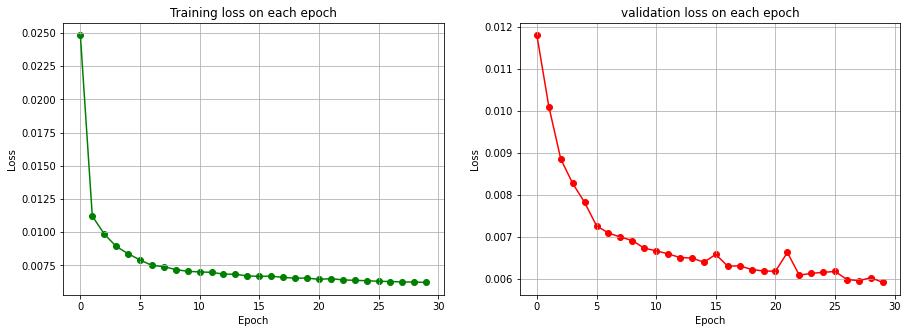

In [ ]:
#model.history.history
plt.figure(figsize=(15,5))
epochs = [i for i in range(30)]
plot_(epochs,model.history.history['loss'],'',1,'Training loss on each epoch','Epoch','Loss',False,'g')
plot_(epochs,model.history.history['val_loss'],'',2,'validation loss on each epoch','Epoch','Loss',False,'r')

*    Their is a strict decrement in the loss for both training and validation.
*    After 30 epochs achieved <strong>0.0066</strong> loss.

**Model Testing:**

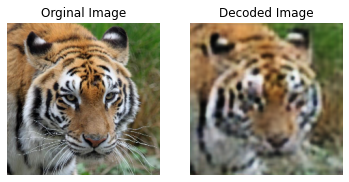

In [ ]:
sample_image = train_data[7]
sample_image = np.expand_dims(sample_image,axis=0)
image = model.predict(sample_image)
plot_(sample_image,'','',1,"Orginal Image","","",True)
plot_(image[0,:,:],'','',2,"Decoded Image","","",True)
plt.show()

**Restoring the Best Model using Model Checkpoint:**

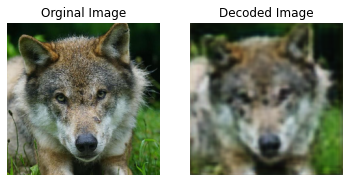

In [ ]:
model = load_model('/content/drive/My Drive/model1.h5')
sample_image = train_data[15]
sample_image = np.expand_dims(sample_image,axis=0)
image = model.predict(sample_image)
plot_(train_data[15],'','',1,2,1,"Orginal Image","","","",True)
plot_(image[0,:,:],'','',1,2,2,"Decoded Image","","","",True)
plt.show()

*    Restorations seems really satisfactory. Images on the left side are original images whereas images on the right side are restored from compressed representation.
*    Decoded image is much flexible and efficient to work rather than working with original image since the compressed representation takes 8 times less space to original image.

In [ ]:
def feature_extraction(model, data, layer = 4):

    """
    Creating a function to run the initial layers of the encoder model. (to get feature extraction from any layer of the model)
    Arguments:
    model - (Auto encoder model) - Trained model
    data - (np.ndarray) - list of images to get feature extraction from trained model
    layer - (int) - from which layer to take the features(by default = 4)
    Returns:
    pooled_array - (np.ndarray) - array of extracted features of given images
    """

    encoded = K.function([model.layers[0].input],[model.layers[last_conv_layer].output])
    encoded_array = encoded([X_data])[0]
    pooled_array = encoded_array.max(axis=-1)
    return pooled_array
encoded = feature_extraction(model,X_data[:10],5)

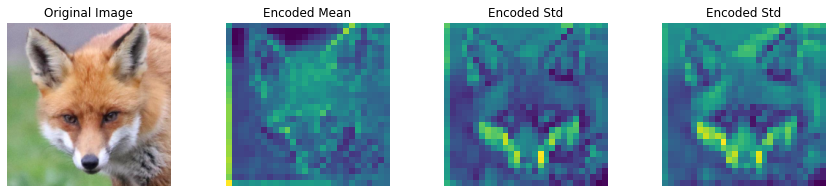

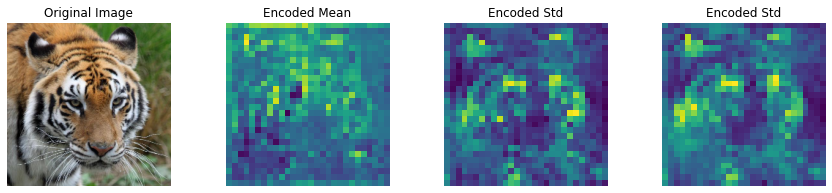

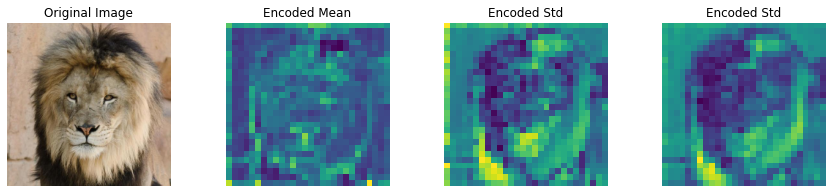

In [ ]:
for index in [1,7,4]:   # 3 random images
    plt.figure(figsize=(15,3))
    plot_(train_data[index],'','',1,4,1,"Original Image","","",'',True)
    plot_(encoded[index].mean(axis=-1),'','',1,4,2,"Encoded Mean","","",'',True)
    plot_(encoded[index].max(axis=-1),'','',1,4,3,"Encoded Std","","",'',True)
    plot_(encoded[index].std(axis=-1),'','',1,4,4,"Encoded Std","","",'',True)
    plt.show()

*    Extracting features from the 5th layer.
*    Dark pixels(yellow) indicates the high activation which helps in differentiating with other images.

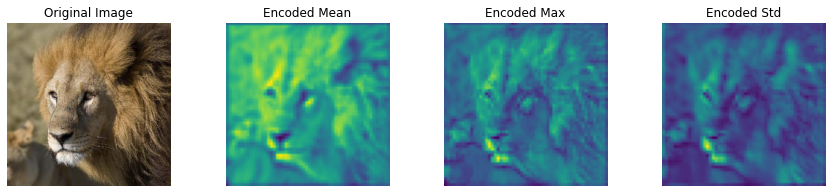

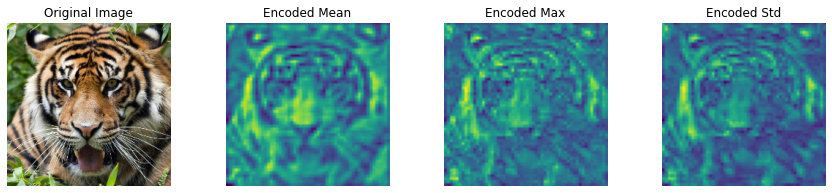

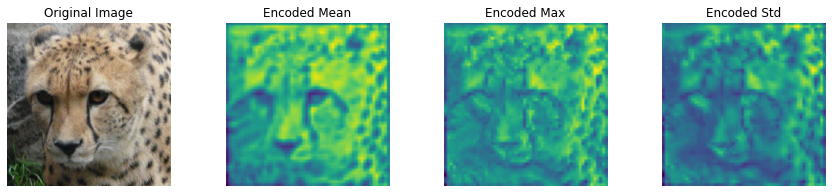

In [ ]:
encoded = feature_extraction(model,X_data[:10],4)
for index in [2,6,9]:   # 3 random images
    plt.figure(figsize=(15,3))
    plot_(train_data[index],'','',1,4,1,"Original Image","","",'',True)
    plot_(encoded[index].mean(axis=-1),'','',1,4,2,"Encoded Mean","","",'',True)
    plot_(encoded[index].max(axis=-1),'','',1,4,3,"Encoded Max","","",'',True)
    plot_(encoded[index].std(axis=-1),'','',1,4,4,"Encoded Std","","",'',True)
    plt.show()

*    Extracting features from the 4th layer.
*    Dark pixels(yellow) indicates the high activation which helps in differentiating with other images.
*    1.   High activation on mane of lion.
     2.   Nose and lines on tigers.
     3.   Dots and lines on the nose for cheetah.
     4.   Nose on foxes.
     
These activation helps in label classification.

In [ ]:
def get_batches(data, batch_size=1000):

    """
    Taking batch of images for extraction of images.
    Arguments:
    data - (np.ndarray or list) - list of image array to get extracted features.
    batch_size - (int) - Number of images per each batch
    Returns:
    list - extracted features of each images
    """

    if len(data) < batch_size:
        return [data]
    n_batches = len(data) // batch_size
    
    # If batches fit exactly into the size of df.
    if len(data) % batch_size == 0:
        return [data[i*batch_size:(i+1)*batch_size] for i in range(n_batches)]   

    # If there is a remainder.
    else:
        return [data[i*batch_size:min((i+1)*batch_size, len(data))] for i in range(n_batches+1)]

In [ ]:
d = np.concatenate([train_data,test_data],axis=0)
d.shape

(4738, 224, 224, 3)

In [ ]:
X_encoded = []
i=0
# Iterate through the full training set.
for batch in get_batches(d, batch_size=500):
    i+=1
    # This line runs our pooling function on the model for each batch.
    X_encoded.append(feature_extraction(model, batch))
    
X_encoded = np.concatenate(X_encoded)

In [ ]:
X_encoded.shape

(4738, 28, 28)

In [ ]:
np.save('X_encoded_compressed.npy', X_encoded)

In [ ]:
X_encoded_reshape = X_encoded.reshape(X_encoded.shape[0], X_encoded.shape[1]*X_encoded.shape[2])
print('Encoded shape:', X_encoded_reshape.shape)

Encoded shape: (4738, 3136)


In [22]:
transform = TSNE() #PCA
trans = transform(n_components=2)
values = trans.fit_transform(X_encoded_reshape)

### Plotting few images of each cluster.

if Number of clusters: 2


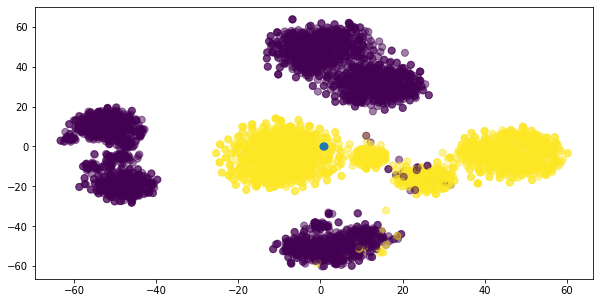

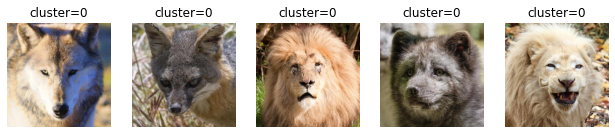

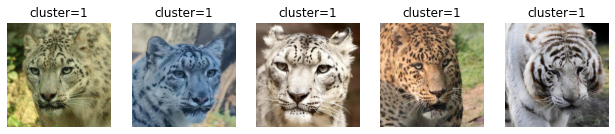


if Number of clusters: 3


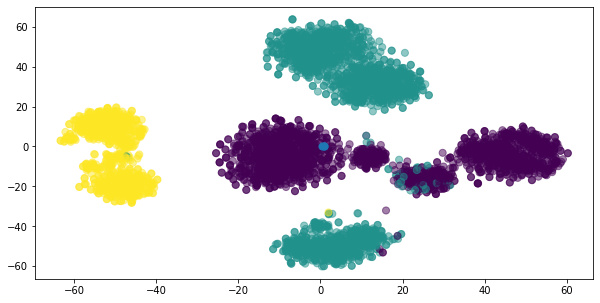

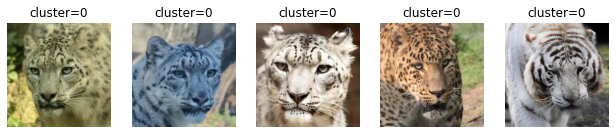

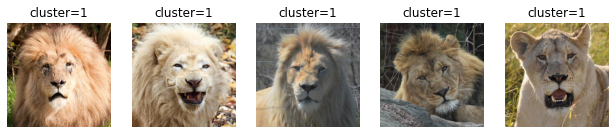

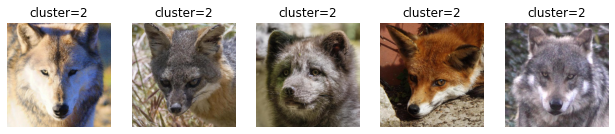


if Number of clusters: 4


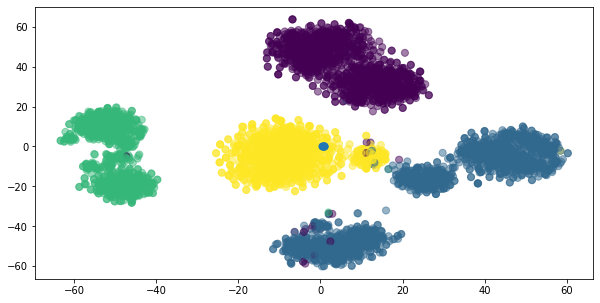

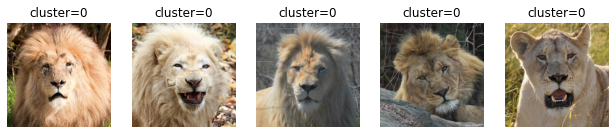

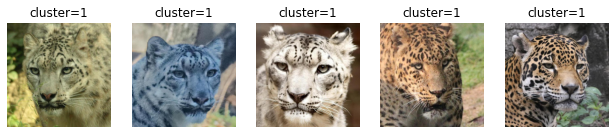

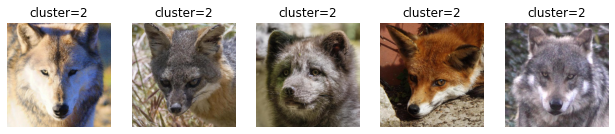

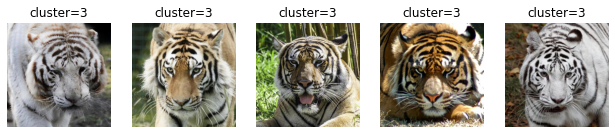


if Number of clusters: 5


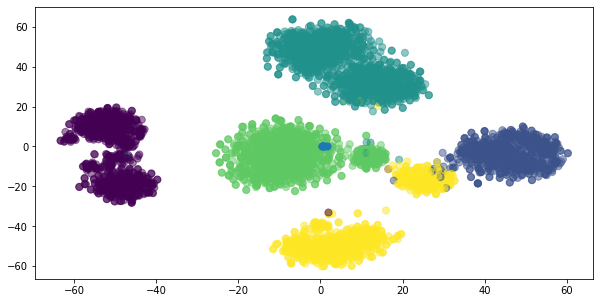

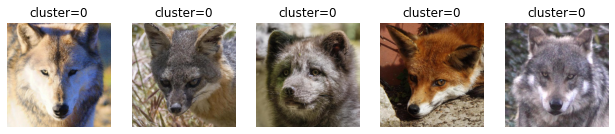

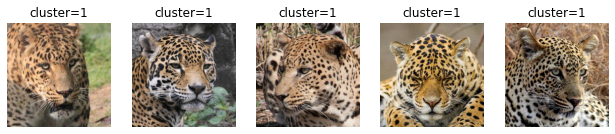

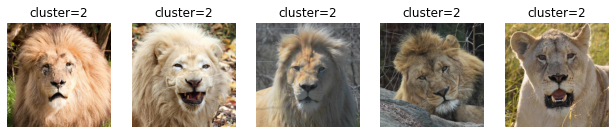

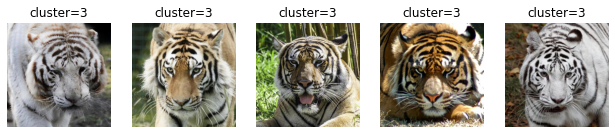

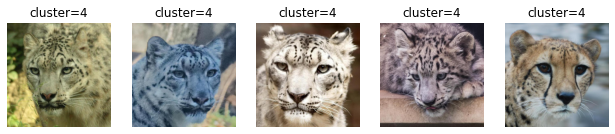

In [29]:
K = [2,3,4,5]
for k in K:
    print("if Number of clusters: "+str(k))
    kmeans = KMeans(n_clusters = k, random_state=0).fit(X_encoded_reshape)
    labels=kmeans.labels_
    centroids = kmeans.cluster_centers_
    plt.figure(figsize=(10,5))
    plt.subplot(1,1,1)
    plt.scatter(values[:,0], values[:,1], c= kmeans.labels_.astype(float), s=50, alpha=0.5)
    plt.scatter(centroids[:, 0], centroids[:, 1], c=None, s=50)
    plt.show()
    for row in range(k):
        iter=0
        plt.figure(figsize=(13,3))
        for i,iterator in enumerate(kmeans.labels_):
            if iterator == row:
                img = cv2.imread("/content/dataset/"+lisp[i])
                img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
                plot_(img,"","",1,6,iter+1,"cluster="+str(row),"","","",True)
                iter+=1
            if iter>=5: break
        plt.show()
    print() 

*    with cluster = 2 
     1.    All foxes and lions are grouped together into one cluster.
     2.    Tigers, cheetahs into another cluster.
*    with cluster = 3
     1.    cheetahs and tigers into first cluster.
     2.    lions into second cluster.
     3.    foxes into third cluster.
*    with cluster = 4
     1.    lions into first cluster.
     2.    cheetahs into second cluster.
     3.    foxes into third cluster.
     4.    Tigers into fourth cluster.</br>
     
     <strong>with k=4 the model has clustered the images into 4 groups and able to differentiate among other groups.(Optimal parameter)</strong>
*    with cluster = 5
     1.    foxes into first cluster.
     2.    cheetahs into second cluster.
     3.    lions into third cluster.
     4.    Tigers into fourth cluster.
     5.    Tiger images with different lighthing conditions and white tigers into fifth cluster.

In [32]:
#Training the model with optimial K value(4 in our case)
kmeans = KMeans(n_clusters=4,random_state=0).fit(X_encoded_reshape)
labels=kmeans.labels_
centroids = kmeans.cluster_centers_

### storing the model for future reference:

In [33]:
kmeans_file = '/content/drive/My Drive/kmeans_model.pkl'
joblib.dump(kmeans,kmeans_file)

['/content/drive/My Drive/kmeans_model.pkl']

In [9]:
clusters_features = []  # separating images into different clusters
cluster_files=[]        #file names of each cluster
for i in [0,1,2,3]:     # iterating for 4 clusters(lions,tigers,foxes,cheetah)
    i_cluster = []
    i_labels=[]
    for iter,j in enumerate(kmeans.labels_):
        if j==i:
            i_cluster.append(X_encoded_reshape[iter])
            i_labels.append(lisp[iter])
    i_cluster = np.array(i_cluster)
    clusters_features.append(i_cluster)
    cluster_files.append(i_labels)

In [87]:
labels=[]
data=[]
files=[]
for iter,i in enumerate(clusters_features):
    data.extend(i)
    labels.extend([iter for i in range(i.shape[0])])
    files.extend(cluster_files[iter])
print(np.array(labels).shape)
print(np.array(data).shape)
print(np.array(files).shape)

(4738,)
(4738, 3136)
(4738,)


### KNN model training to find similar images:

In [12]:
knn = KNeighborsClassifier(n_neighbors=5,algorithm='ball_tree',n_jobs=-1)
knn.fit(np.array(data),np.array(labels))

KNeighborsClassifier(algorithm='ball_tree', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')

### storing the model for future reference:

In [31]:
knn_file = '/content/drive/My Drive/knn_model.pkl'
joblib.dump(knn,knn_file)

['/content/knn_model.pkl']

In [ ]:
def results_(query,result):
    
    """
    Plotting the N similar images from the dataset with query image.
    Arguments:
    query - (string) - filename of the query image
    result - (list) - filenames of similar images
    """
    
    def read(img):
        image = cv2.imread('/content/dataset/'+img)
        image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
        return image
    plt.figure(figsize=(10,5))
    if type(query)!=type(30):
        plot_(query,"","",1,1,1,"Query Image","","","",True)
    else:
        plot_(read(files[query]),"","",1,1,1,"Query Image "+files[query],"","","",True)
    plt.show()
    plt.figure(figsize=(20,5))
    for iter,i in enumerate(result):
        plot_(read(files[i]),"","",1,len(result),iter+1,files[i],"","","",True)
    plt.show()

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


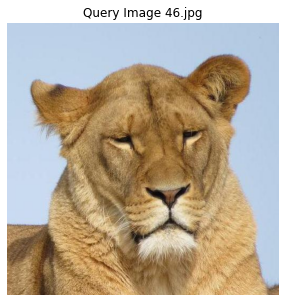

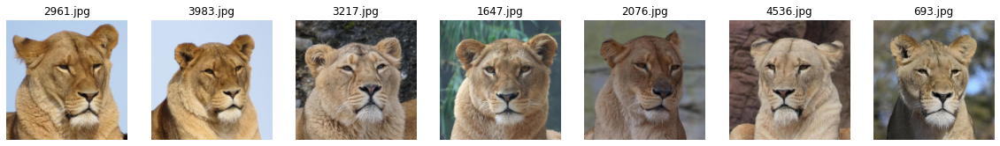

In [14]:
num = 900   #datapoint
res = knn.kneighbors(data[num].reshape(1,-1),return_distance=True,n_neighbors=8)
results_(num,list(res[1][0])[1:])

In [77]:
def predictions(label,N=8,isurl=False):
    
    """
    Making predictions for the query images and returns N similar images from the dataset.
    We can either pass filename or the url for the image.
    Arguments:
    label - (string) - file name of the query image.
    N - (int) - Number of images to be returned
    isurl - (string) - if query image is from google is set to True else False(By default = False)
    """
    
    if isurl:
        img = io.imread(label)
        img = cv2.resize(img,(224,224))
    else:
        img_path = '/content/dataset/'+label
        img = image.load_img(img_path, target_size=(224,224))
    img_data = image.img_to_array(img)
    img_data = np.expand_dims(img_data,axis=0)
    img_data = preprocess_input(img_data)
    feature = model.predict(img_data)
    feature = np.array(feature).flatten().reshape(1,-1)
    res = knn.kneighbors(feature.reshape(1,-1),return_distance=True,n_neighbors=N)
    results_(img,list(res[1][0])[1:])  # for plotting similar images with query images

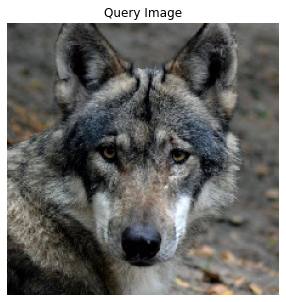

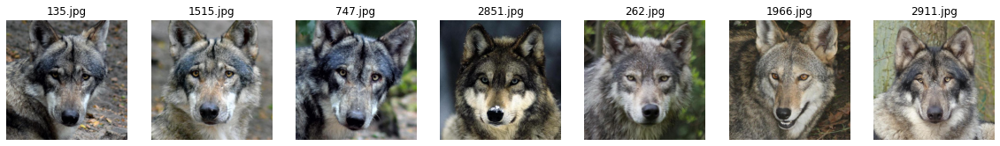

In [72]:
query_path = '2550.jpg'
predictions(query_path)

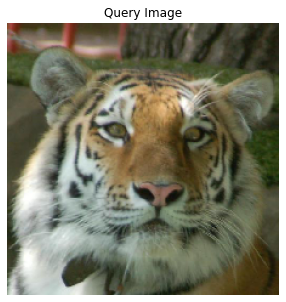

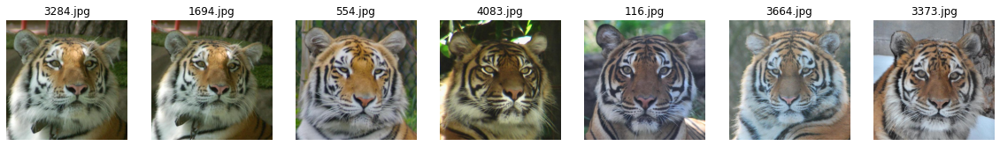

In [67]:
query_path = '1127.jpg'
predictions(query_path)

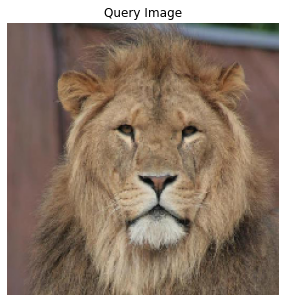

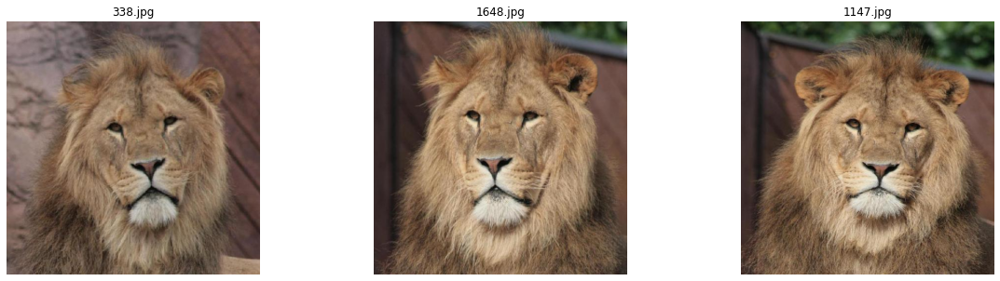

In [74]:
query_path = '3057.jpg'
predictions(query_path,4)

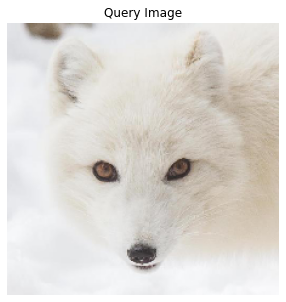

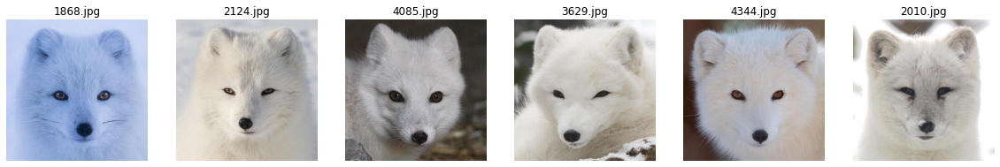

In [93]:
query_path = '4107.jpg'
predictions(query_path,7)

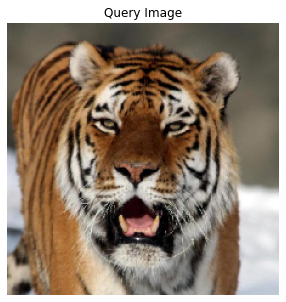

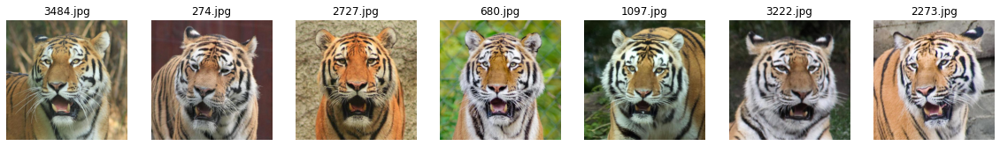

In [75]:
query_path = '167.jpg'
predictions(query_path)

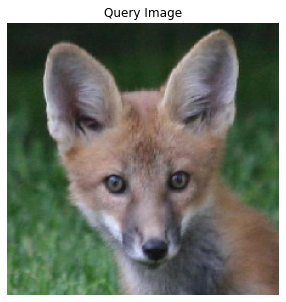

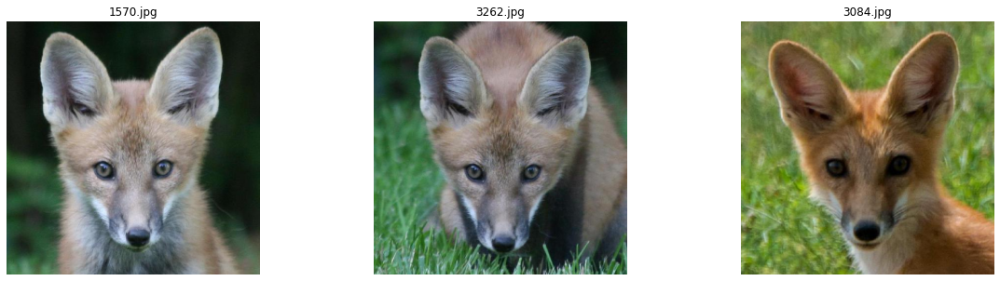

In [76]:
query_path = '543.jpg'
predictions(query_path,4)

**Testing with google images:**

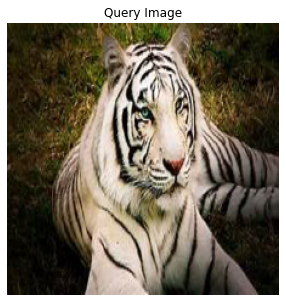

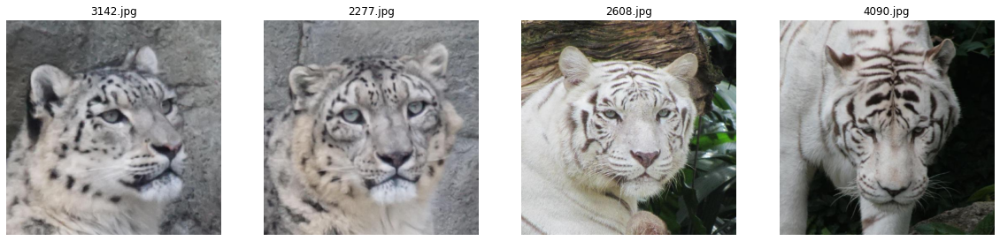

In [79]:
query_path = 'https://tse2.mm.bing.net/th?id=OIP.ACrXAsXM21TxizepPZsUDgHaEV&pid=Api&P=0&w=271&h=159'
predictions(query_path,5,isurl=True)

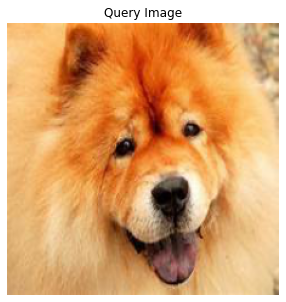

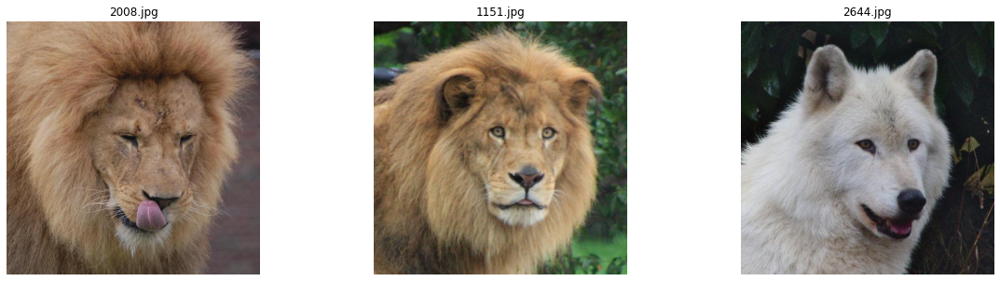

In [80]:
query_path = 'https://tse1.mm.bing.net/th?id=OIP.N9IoY1SO_i85UqS6paZKwwHaFj&pid=Api&P=0&w=239&h=180'
predictions(query_path,4,isurl=True)

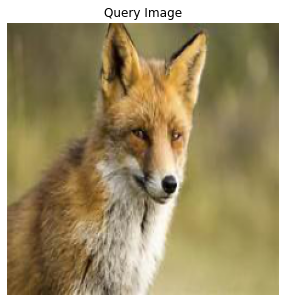

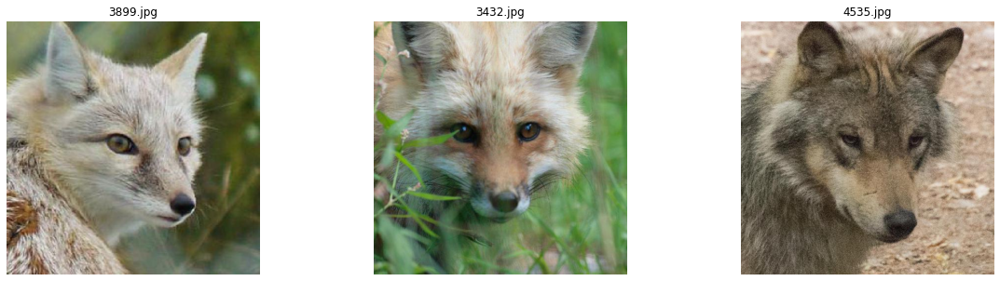

In [81]:
query_path = 'https://tse4.mm.bing.net/th?id=OIP.NIMP0bTfhF3898t_ZYLB8QHaE8&pid=Api&P=0&w=248&h=166'
predictions(query_path,4,isurl=True)

## Summary Section:

### Plan of Action:

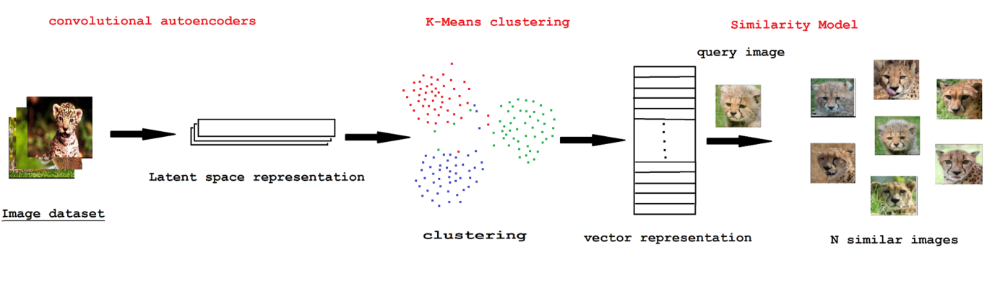

*    We have nearly ~5K images with 512x512 resolution gives ~1,310,720,000 pixels. Loading into RAM and processing each image with every other image will be computationally expensive and may crashes the system(GPU or TPU).
*    So as a solution I integrated both convolutional neural networks and autoencoder ideas for information reduction from image based data. 
*    That would be pre-processing step for clustering.
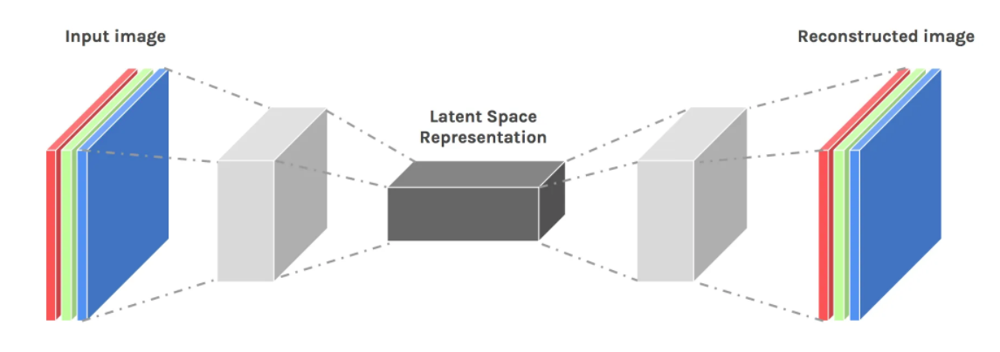

<strong>Convolutional AutoEncoders:</strong>
*    We can call left to centroid side as convolution whereas centroid to right side as deconvolution.
*    Deconvolution side is also known as unsampling or transpose convolution. It is a basic reduction operation.
*    Reverse operation using upsampling to decode the encoded image.
*    Building an autoencoder model, grabing the compressed image from the intermediate layers, then feed that lower-dimension array into KMeans clustering. 

<strong>K-Means Clustering</strong>
*    We can then apply clustering to compressed representation. I would like to apply k-means clustering to cluster the images into 4 groups.
*    This could fasten labeling process for unlabeled data.

<strong>KNN</strong>
*    Model training to find N similar images.
*    Finding Nearest neighbors and taking N nearest points as similar images given on a query image.

<strong>Prediction Algorithm:</strong>

   Step-1: taking either filename or url and converting that image into image array.
   
   Step-2: Using that array finding the feature from the intermediate layers of the trained autoencoder model.
   
   Step-3: From the extracted features finding the label to which that image belongs using K-Means clustering.
   
   Step-4: Using KNN model finding N similar images using predict images and finally plotting the result.